In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from math import sqrt
from math import exp
from PIL import Image, ImageFilter
from scipy.ndimage.filters import median_filter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###Reading from dataset and displaying spectrum, centered and decentralized spectrum

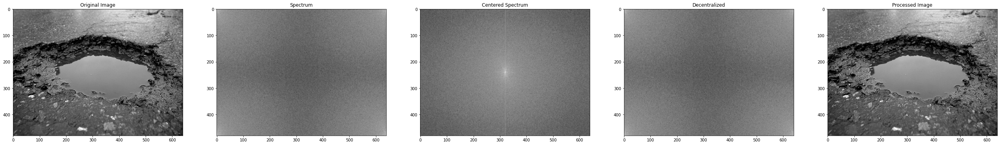

In [ ]:
plt.figure(figsize=(6.4*7, 4.8*7), constrained_layout=False)

img = cv2.imread("/content/drive/MyDrive/Potholes Dataset/6.jpg", 0)
plt.subplot(151), plt.imshow(img, "gray"), plt.title("Original Image")

original = np.fft.fft2(img)
plt.subplot(152), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

center = np.fft.fftshift(original)
plt.subplot(153), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

inv_center = np.fft.ifftshift(center)
plt.subplot(154), plt.imshow(np.log(1+np.abs(inv_center)), "gray"), plt.title("Decentralized")

processed_img = np.fft.ifft2(inv_center)
plt.subplot(155), plt.imshow(np.abs(processed_img), "gray"), plt.title("Processed Image")

plt.show()

###Displaying the spectrum and phase angle

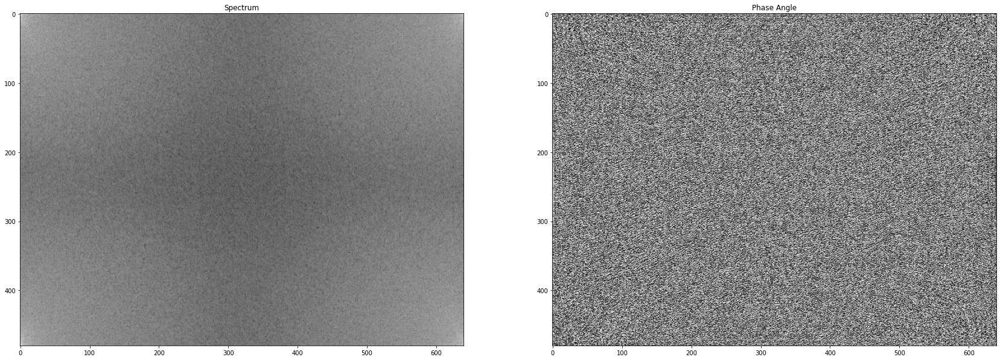

In [ ]:
plt.figure(figsize=(6.4*7, 4.8*7), constrained_layout=False)

img = cv2.imread("/content/drive/MyDrive/Potholes Dataset/6.jpg", 0)

original = np.fft.fft2(img)
plt.subplot(131), plt.imshow(np.log(np.abs(original)), "gray"), plt.title("Spectrum")

plt.subplot(132), plt.imshow(np.angle(original), "gray"), plt.title("Phase Angle")
plt.show()

### Applying the formulas for all types of Low Pass and High Pass filters

In [ ]:
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)


def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base
      
def butterworthLP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

###Ideal Low Pass Filter

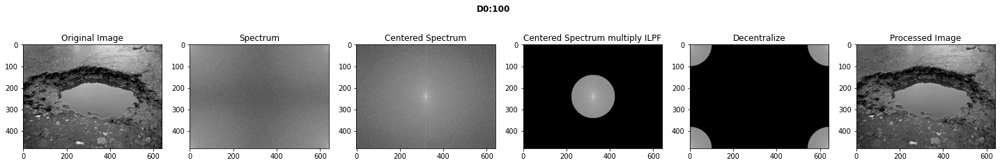

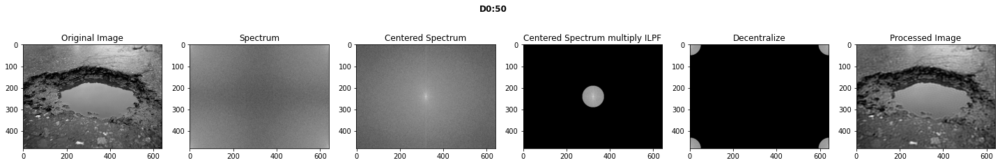

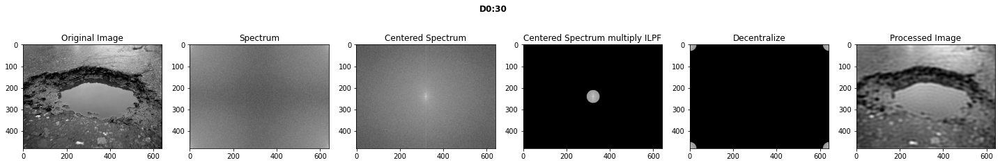

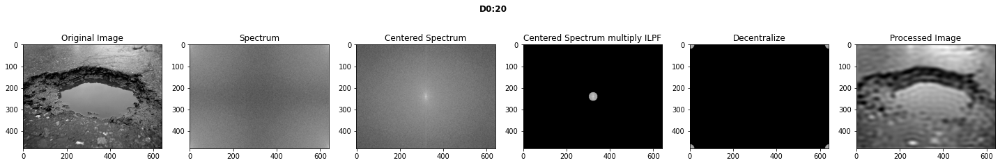

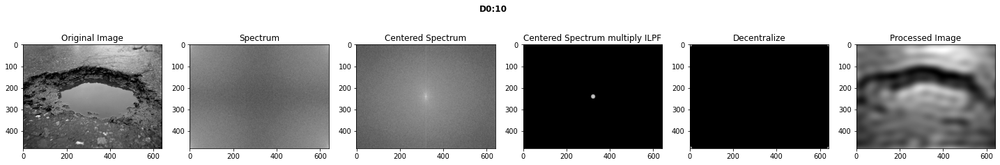

In [ ]:
def try_d0s_lp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center * idealFilterLP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply ILPF")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_lp(i)

###Gaussian Low Pass Filter

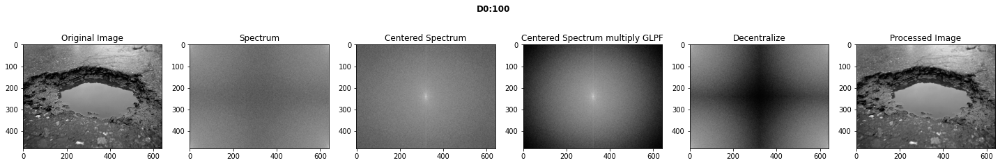

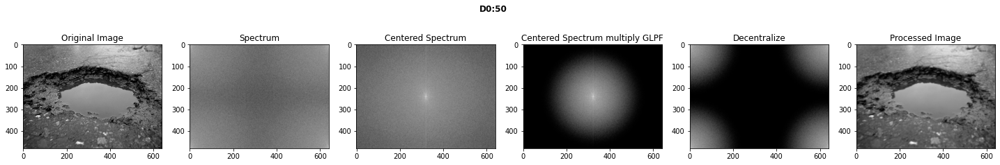

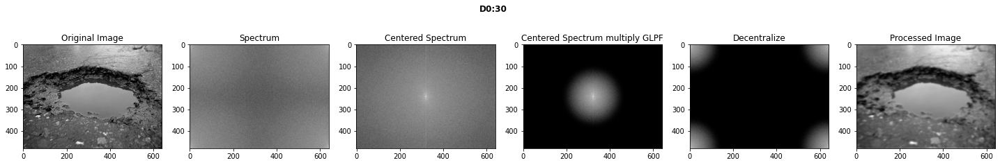

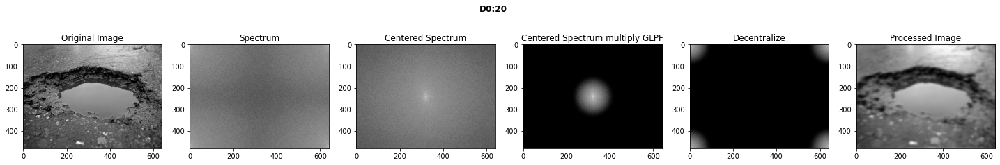

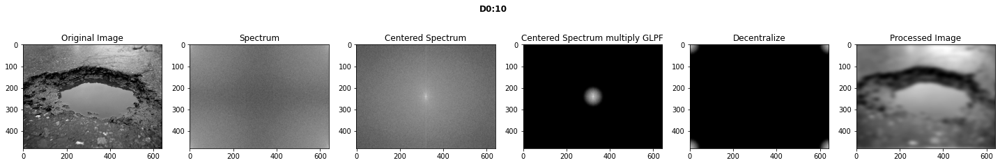

In [ ]:
def try_d0s_lp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center * gaussianLP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply GLPF")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_lp(i)

###Butterworth Low Pass Filter

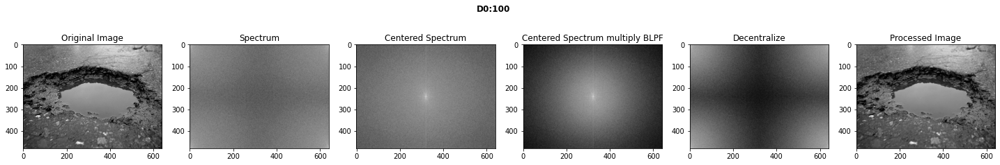

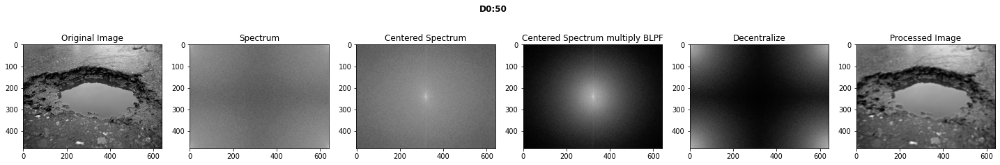

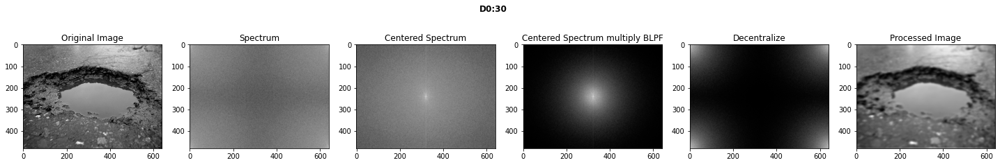

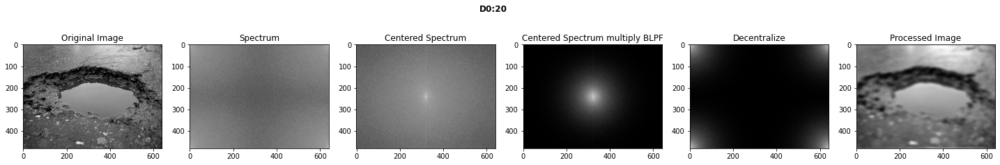

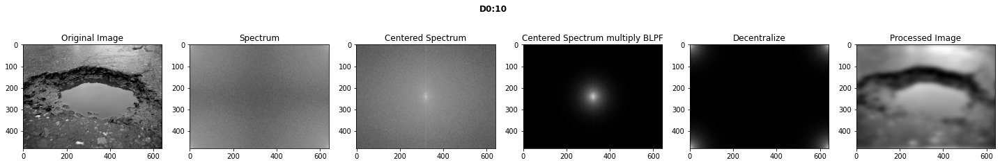

In [ ]:
def try_d0s_lp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center * butterworthLP(d0,img.shape,2)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply BLPF")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_lp(i)

###Setting D0=50 : Low Pass Filters

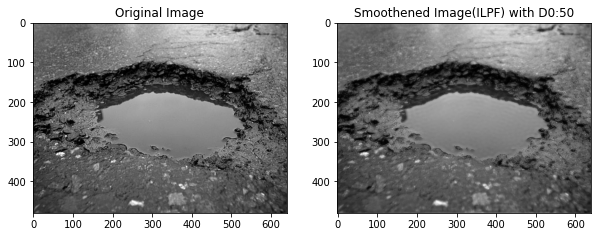

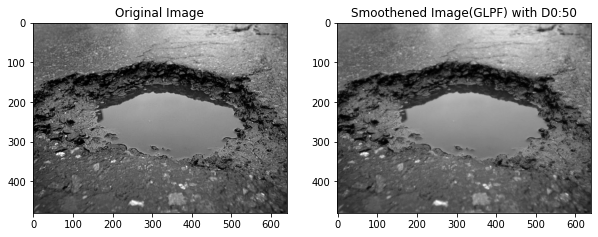

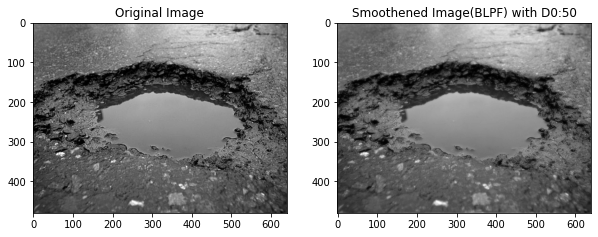

In [ ]:
d0 = 50
# perform FFT
original = np.fft.fft2(img)
# get spectrum
center = np.fft.fftshift(original)
# center spectrum for high pass
HighPassCenter = center * idealFilterLP(d0,img.shape)
# perform high pass
HighPass = np.fft.ifftshift(HighPassCenter)
# reverse FFT -> IFFT
inverse_HighPass = np.fft.ifft2(HighPass)
# add filter to original image
smooth= img+np.abs(inverse_HighPass)


plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, "gray")
plt.title("Original Image")

plt.subplot(122)
plt.imshow(smooth,cmap="gray")
plt.title("Smoothened Image(ILPF) with D0:"+str(d0))
plt.show()

# perform FFT
original = np.fft.fft2(img)
# get spectrum
center = np.fft.fftshift(original)
# center spectrum for high pass
HighPassCenter = center * gaussianLP(d0,img.shape)
# perform high pass
HighPass = np.fft.ifftshift(HighPassCenter)
# reverse FFT -> IFFT
inverse_HighPass = np.fft.ifft2(HighPass)
# add filter to original image
smooth_s = img+np.abs(inverse_HighPass)


plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, "gray")
plt.title("Original Image")

plt.subplot(122)
plt.imshow(smooth_s,cmap="gray")
plt.title("Smoothened Image(GLPF) with D0:"+str(d0))
plt.show()

# perform FFT
original = np.fft.fft2(img)
# get spectrum
center = np.fft.fftshift(original)
# center spectrum for high pass
HighPassCenter = center * butterworthLP(d0,img.shape,2)
# perform high pass
HighPass = np.fft.ifftshift(HighPassCenter)
# reverse FFT -> IFFT
inverse_HighPass = np.fft.ifft2(HighPass)
# add filter to original image
smooth = img+np.abs(inverse_HighPass)


plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, "gray")
plt.title("Original Image")

plt.subplot(122)
plt.imshow(smooth,cmap="gray")
plt.title("Smoothened Image(BLPF) with D0:"+str(d0))
plt.show()

###Ideal High Pass Filter

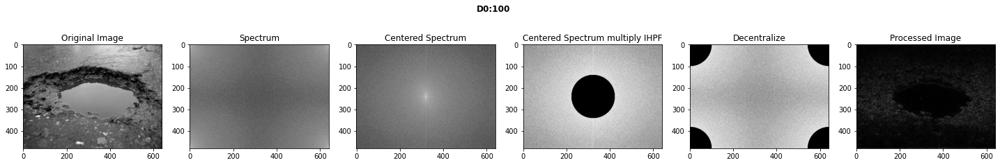

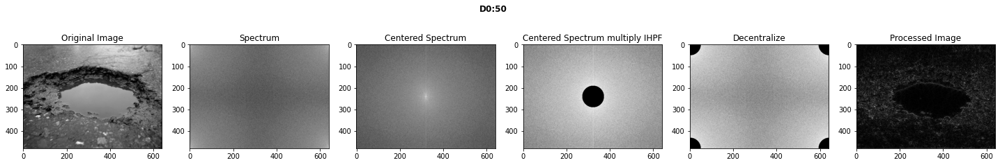

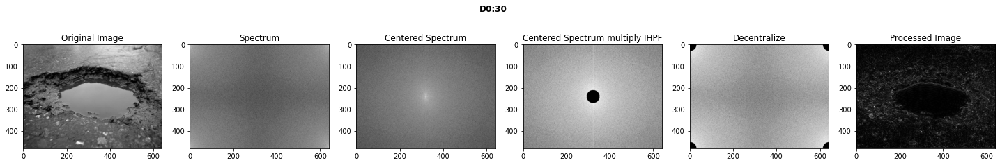

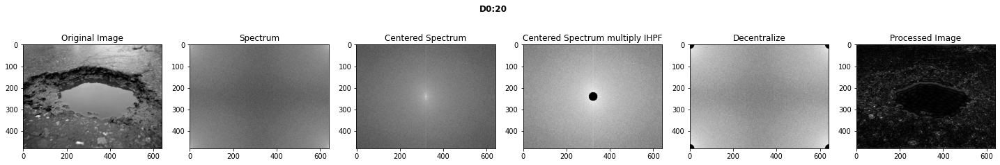

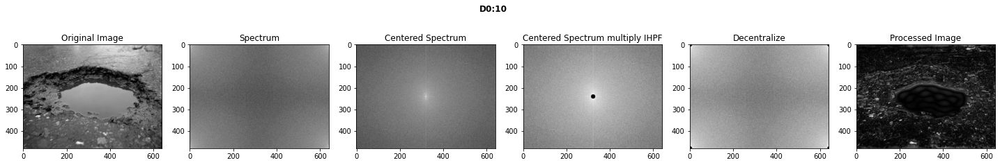

In [ ]:
def try_d0s_hp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(smooth_s, "gray"), plt.title("Original Image")

    original = np.fft.fft2(smooth_s)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * idealFilterHP(d0,smooth_s.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply IHPF")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_hp(i)

###Gaussian High Pass Filter

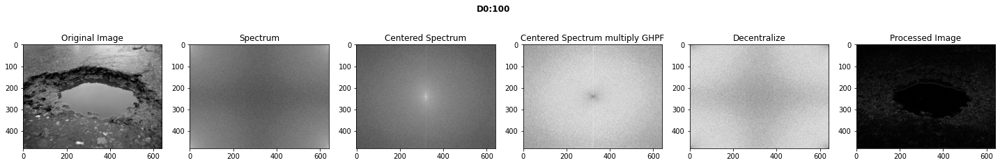

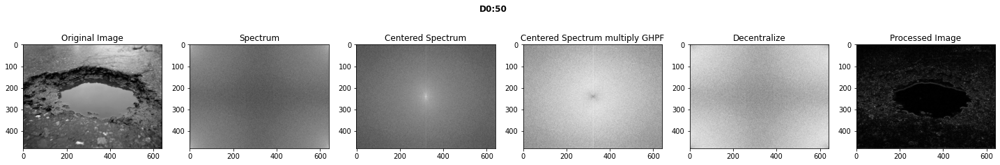

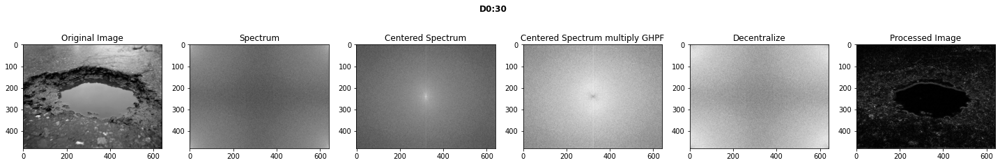

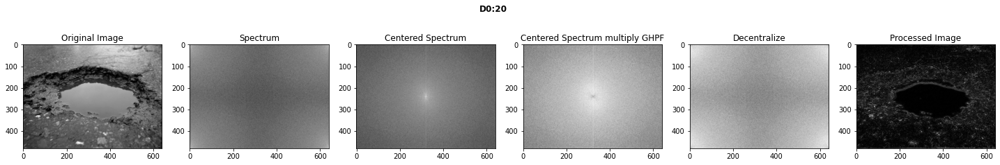

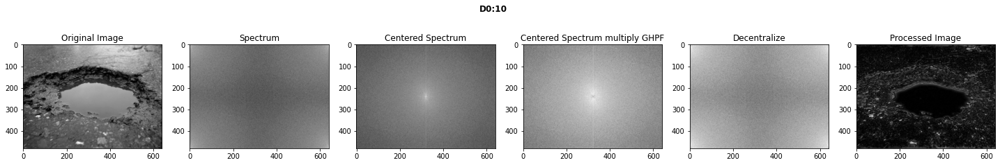

In [ ]:
def try_d0s_hp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(smooth_s, "gray"), plt.title("Original Image")

    original = np.fft.fft2(smooth_s)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * gaussianHP(d0,smooth_s.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply GHPF")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_hp(i)

###Butterworth High Pass Filter

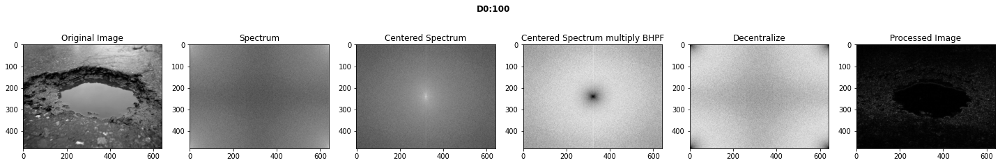

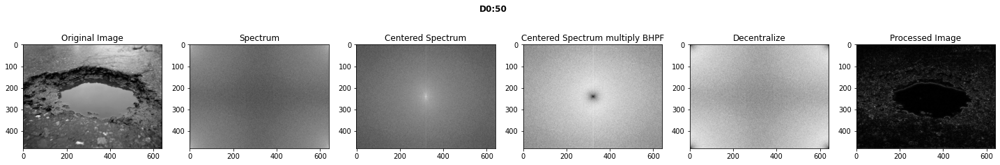

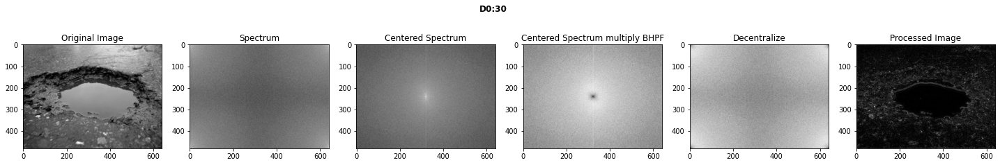

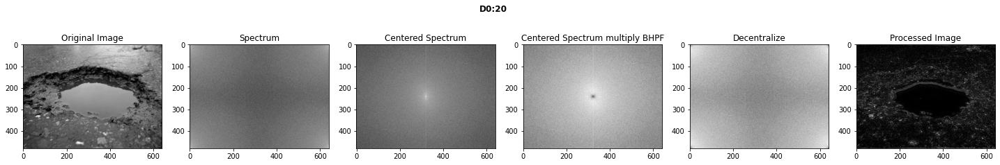

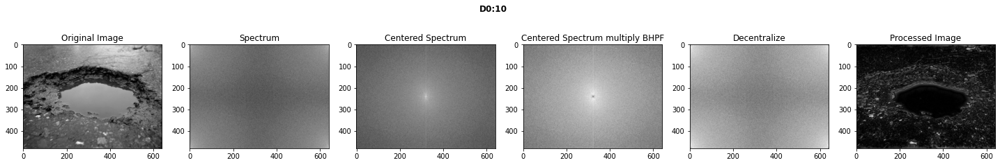

In [ ]:
def try_d0s_hp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(smooth_s, "gray"), plt.title("Original Image")

    original = np.fft.fft2(smooth_s)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * butterworthHP(d0,smooth_s.shape,2)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply BHPF")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_hp(i)

###Setting D0=10 : High Pass Filters

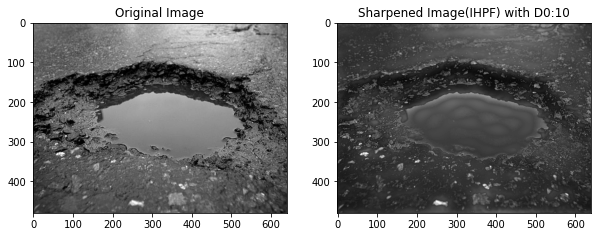

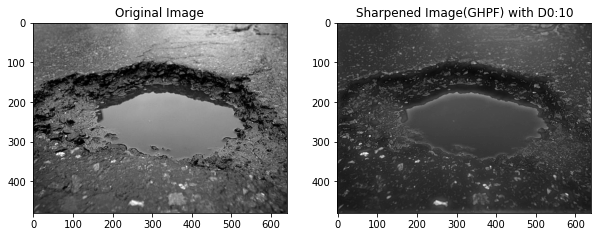

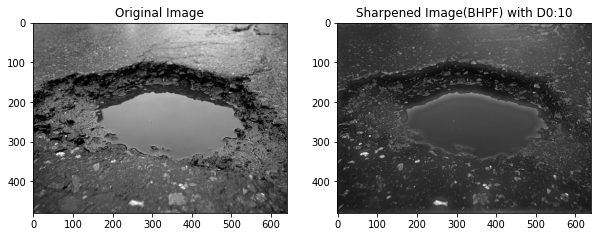

In [ ]:
d0 = 10
# perform FFT
original = np.fft.fft2(smooth_s)
# get spectrum
center = np.fft.fftshift(original)
# center spectrum for high pass
HighPassCenter = center * idealFilterHP(d0,smooth_s.shape)
# perform high pass
HighPass = np.fft.ifftshift(HighPassCenter)
# reverse FFT -> IFFT
inverse_HighPass = np.fft.ifft2(HighPass)
# add filter to original image
sharpened = img+np.abs(inverse_HighPass)


plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, "gray")
plt.title("Original Image")

plt.subplot(122)
plt.imshow(sharpened,cmap="gray")
plt.title("Sharpened Image(IHPF) with D0:"+str(d0))
plt.show()

# perform FFT
original = np.fft.fft2(smooth_s)
# get spectrum
center = np.fft.fftshift(original)
# center spectrum for high pass
HighPassCenter = center * gaussianHP(d0,smooth_s.shape)
# perform high pass
HighPass = np.fft.ifftshift(HighPassCenter)
# reverse FFT -> IFFT
inverse_HighPass = np.fft.ifft2(HighPass)
# add filter to original image
sharpened = img+np.abs(inverse_HighPass)


plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, "gray")
plt.title("Original Image")

plt.subplot(122)
plt.imshow(sharpened,cmap="gray")
plt.title("Sharpened Image(GHPF) with D0:"+str(d0))
plt.show()

# perform FFT
original = np.fft.fft2(smooth_s)
# get spectrum
center = np.fft.fftshift(original)
# center spectrum for high pass
HighPassCenter = center * butterworthHP(d0,smooth_s.shape,2)
# perform high pass
HighPass = np.fft.ifftshift(HighPassCenter)
# reverse FFT -> IFFT
inverse_HighPass = np.fft.ifft2(HighPass)
# add filter to original image
sharpened_h = img+np.abs(inverse_HighPass)


plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, "gray")
plt.title("Original Image")

plt.subplot(122)
plt.imshow(sharpened_h,cmap="gray")
plt.title("Sharpened Image(BHPF) with D0:"+str(d0))
plt.show()

###Laplacian, Sobel Filtering Technique

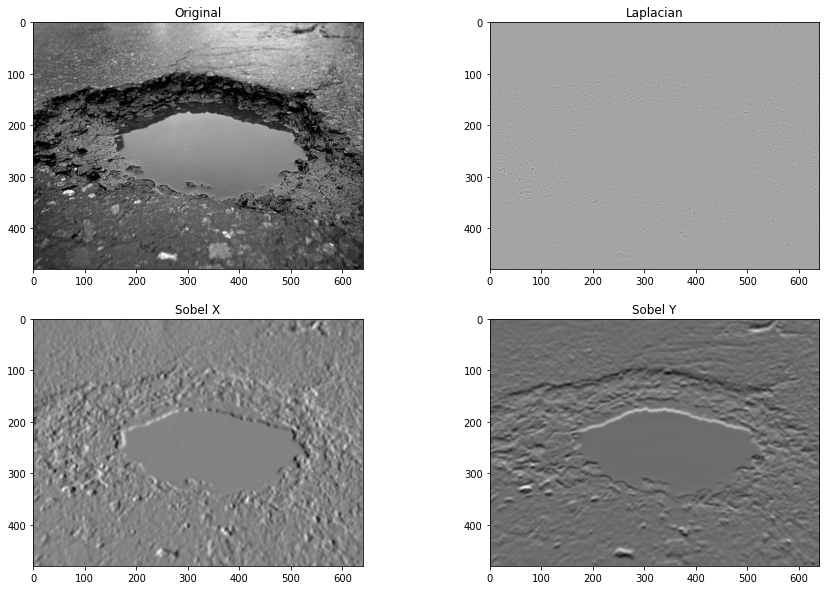

In [ ]:
laplacian = cv2.Laplacian(sharpened_h,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=21)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=21)

plt.figure(figsize=(15, 10))
plt.subplot(2,2,1)
plt.imshow(img, cmap = 'gray')
plt.title('Original')
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian')
plt.subplot(2,2,3)
plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X')
plt.subplot(2,2,4)
plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y')

plt.show()

###Thresholding of Laplacian and Sobel 

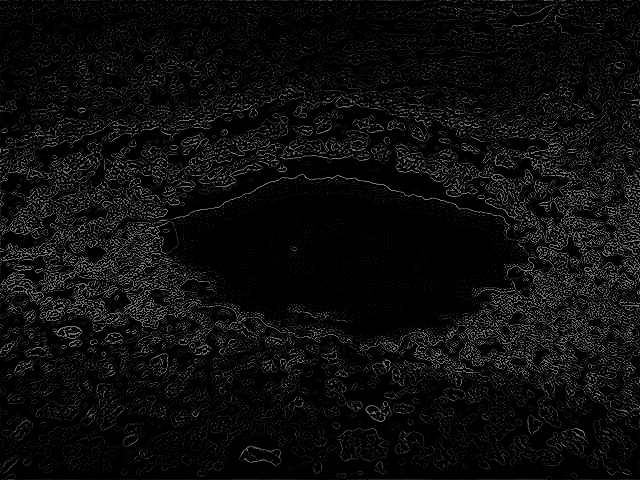

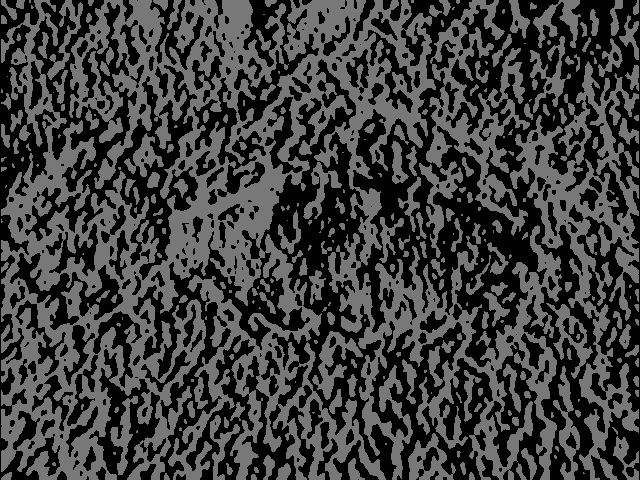

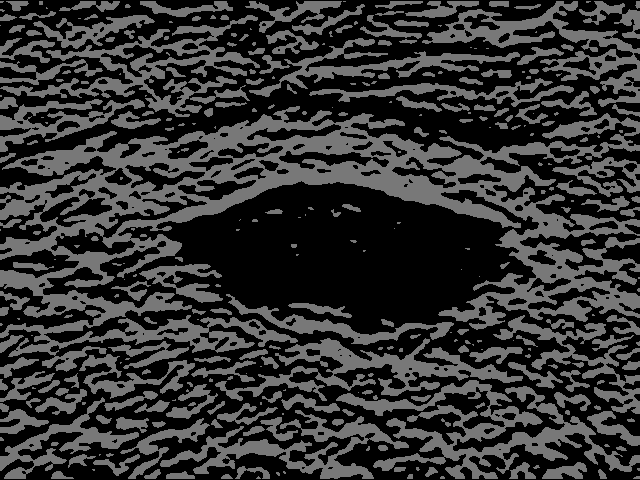

In [ ]:
from google.colab.patches import cv2_imshow
ret, thresh1= cv2.threshold(laplacian, 120, 255, cv2.THRESH_TRUNC)
ret, thresh2= cv2.threshold(sobelx, 120, 255, cv2.THRESH_TRUNC)
ret, thresh3= cv2.threshold(sobely, 120, 255, cv2.THRESH_TRUNC)
cv2_imshow(thresh1)
cv2_imshow(thresh2)
cv2_imshow(thresh3)
# De-allocate any associated memory usage
if cv2.waitKey(0) & 0xff == 27:
	cv2.destroyAllWindows()


###Canny Edge Detector

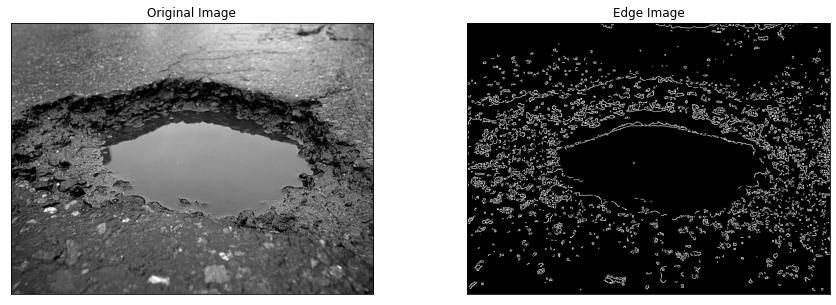

In [ ]:
image = np.uint8(sharpened_h)
edges = cv2.Canny(image,300,400)
plt.figure(figsize=(15,5))
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

###Unsharp Masking and High Boost Filtering

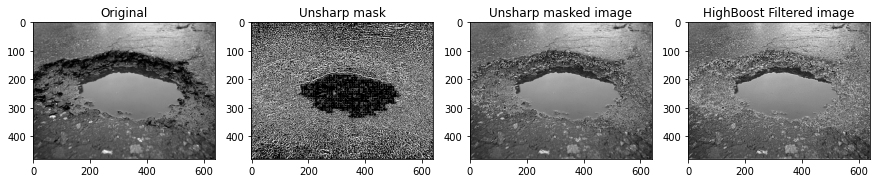

In [ ]:
from skimage import data
from skimage import img_as_ubyte, img_as_int
from scipy import ndimage

low_pass = (1/9)*np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]], dtype='float64') #LP mask
blurred = ndimage.convolve(img, low_pass, mode='constant', cval=0.0)
unsharp_mask = img_as_ubyte(img - blurred)
unsharp = img_as_ubyte(img + 1*unsharp_mask)
highboost=img_as_ubyte(img + 3*unsharp_mask)

plt.figure(figsize=(15,5))
plt.subplot(1, 4, 1)
plt.title('Original')
plt.imshow(img,cmap="gray")
plt.subplot(1, 4, 2)
plt.title('Unsharp mask')
plt.imshow(unsharp_mask,cmap="gray")
plt.subplot(1, 4, 3)
plt.title('Unsharp masked image')
plt.imshow(unsharp,cmap="gray")
plt.subplot(1, 4, 4)
plt.title('HighBoost Filtered image')
plt.imshow(highboost,cmap="gray")

###Frequency Domain Filtering VS Spatial Domain Filtering

Frequency threshold


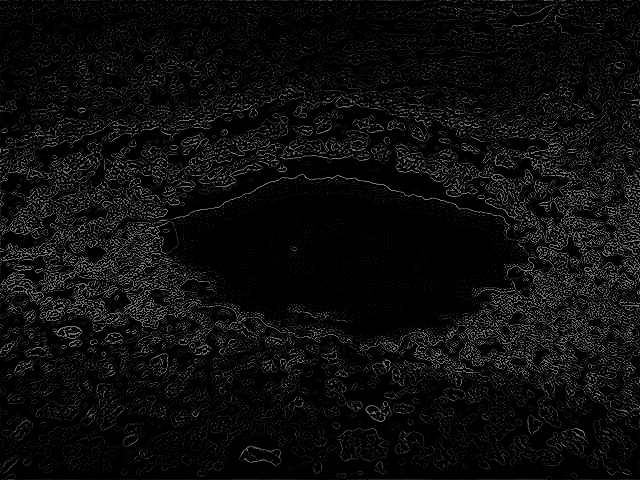

Spatial threshold


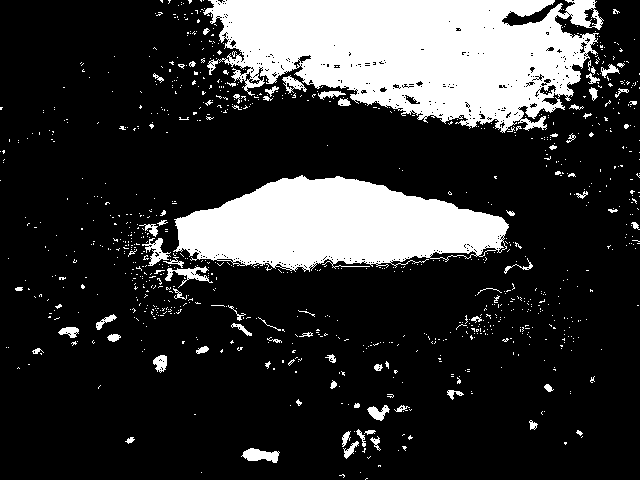

In [ ]:
#comparison of Frequency domain filtering vs Spacial Domain Filtering
from google.colab.patches import cv2_imshow
ret, thresh= cv2.threshold(laplacian, 120, 255, cv2.THRESH_TRUNC)
print("Frequency threshold")
cv2_imshow(thresh)
#spatial image
med_image = median_filter(img,5)
hist,bins = np.histogram(med_image.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*225/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img2 = cdf[med_image]
lap = cv2.Laplacian(med_image,cv2.CV_64F)
sharp = img2 - 0.9*lap
ret, thresh1 = cv2.threshold(sharp, 180, 255, cv2.THRESH_BINARY)
print("Spatial threshold")
cv2_imshow(thresh1)


###Noise Models

1) Periodic Noise

Text(0.5, 1.0, 'Spectrum')

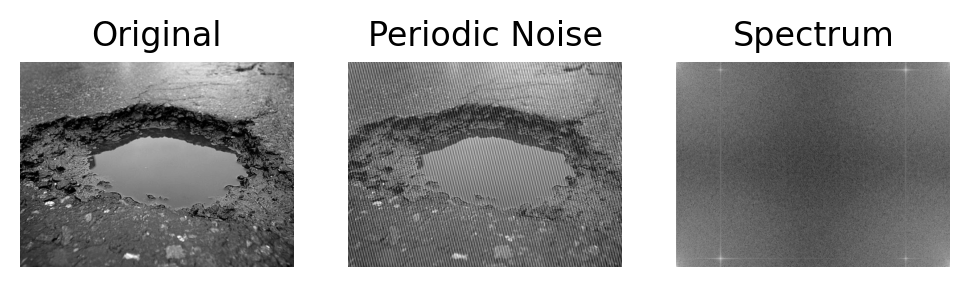

In [ ]:
#noise
def add_periodic(img):
    orig = img
    sh = orig.shape[0], orig.shape[1]
    noise = np.zeros(sh, dtype='float64')
    X, Y = np.meshgrid(range(0, sh[1]), range(0, sh[0]))
    #print(X.shape,Y.shape)
    A = 50
    u0 = 45
    v0 = 50
    noise += A*np.sin(X*u0 + Y*v0)

    A = -18
    u0 = -45
    v0 = 50

    noise += A*np.sin(X*u0 + Y*v0)

    noiseada = orig+noise
    return(noiseada)
periodic = add_periodic(img).astype(int)
original = np.fft.fft2(periodic)


fig=plt.figure(dpi=200)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(periodic,cmap='gray')
plt.axis("off")
plt.title("Periodic Noise")

fig.add_subplot(1,3,3)
plt.imshow(np.log(1 + np.abs(original)),cmap='gray')
plt.axis("off")
plt.title("Spectrum")

Notch Filtering to remove periodic noise

<ipython-input-20-df963065560f>:21: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow((20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.gray)


Text(0.5, 1.0, 'Recovered image')

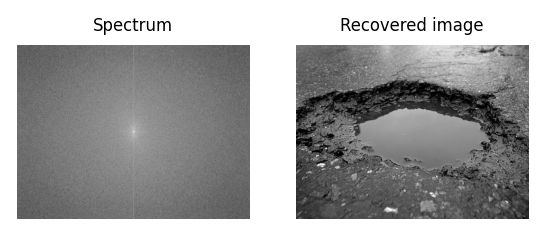

In [ ]:
from scipy import fftpack #notch
import numpy.fft as fp
w = 10
h = 10

im = img
F1 = fftpack.fft2((im).astype(float))
F2 = fftpack.fftshift(F1)
for i in range(60, w, 135):
    for j in range(100, h, 200):
        if not (i == 330 and j == 500):
            F2[i-10:i+10, j-10:j+10] = 0
    for i in range(0, w, 135):
        for j in range(200, h, 200):
            if not (i == 330 and j == 500):
                F2[max(0,i-15):min(w,i+15), max(0,j-15):min(h,j+15)] = 0

fig=plt.figure(dpi=170)

fig.add_subplot(1,3,1)
plt.imshow((20*np.log10( 0.1 + F2)).astype(int), cmap=plt.cm.gray)
plt.axis("off")
plt.title("Spectrum",fontsize=7)
#plt.show()
im1 = fp.ifft2(fftpack.ifftshift(F2)).real

fig.add_subplot(1,3,2)
plt.imshow(im1, cmap='gray')
plt.axis("off")
plt.title("Recovered image",fontsize=7)

2) Salt and Pepper Noise (Impulse)

Text(0.5, 1.0, 'median filter')

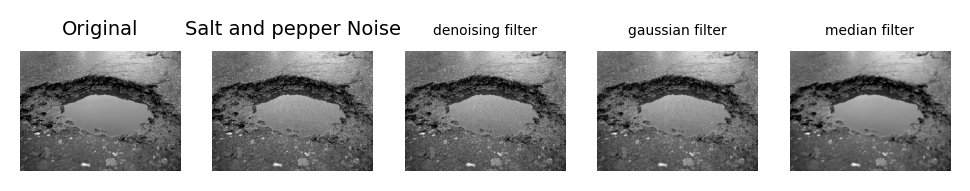

In [ ]:
import random

def add_noise(img):

	# Getting the dimensions of the image
	row,col = img.shape
	
	# Randomly pick some pixels in the
	# image for coloring them white
	# Pick a random number between 300 and 10000
	number_of_pixels = random.randint(300, 10000)
	for i in range(number_of_pixels):
	
		# Pick a random y coordinate
		y_coord=random.randint(0, row - 1)
		
		# Pick a random x coordinate
		x_coord=random.randint(0, col - 1)
		
		# Color that pixel to white
		img[y_coord][x_coord] = 255
		
	# Randomly pick some pixels in
	# the image for coloring them black
	# Pick a random number between 300 and 10000
	number_of_pixels = random.randint(300 , 10000)
	for i in range(number_of_pixels):
	
		# Pick a random y coordinate
		y_coord=random.randint(0, row - 1)
		
		# Pick a random x coordinate
		x_coord=random.randint(0, col - 1)
		
		# Color that pixel to black
		img[y_coord][x_coord] = 0
		
	return img

# salt-and-pepper noise can
# be applied only to grayscale images
# Reading the color image in grayscale image
img=cv2.imread('/content/drive/MyDrive/Pothole_dataset/6.jpg', cv2.IMREAD_GRAYSCALE)
imx=cv2.imread('/content/drive/MyDrive/Pothole_dataset/6.jpg', cv2.IMREAD_GRAYSCALE)
#Storing the image
im=add_noise(imx)
#denoising
new_image = cv2.fastNlMeansDenoising(im,None,10,10)
blurred22=cv2.GaussianBlur(im,(3,3),1)
med = cv2.medianBlur(im,5)

fig=plt.figure(dpi=200)

fig.add_subplot(1,5,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original",fontsize=7)

fig.add_subplot(1,5,2)
plt.imshow(im,cmap='gray')
plt.axis("off")
plt.title("Salt and pepper Noise",fontsize=7)

fig.add_subplot(1,5,3)
plt.imshow(new_image,cmap='gray')
plt.axis("off")
plt.title("denoising filter",fontsize=5)

fig.add_subplot(1,5,4)
plt.imshow(blurred22,cmap='gray')
plt.axis("off")
plt.title("gaussian filter",fontsize=5)

fig.add_subplot(1,5,5)
plt.imshow(med,cmap='gray')
plt.axis("off")
plt.title("median filter",fontsize=5)

3) Gaussian Noise

Text(0.5, 1.0, 'median filter')

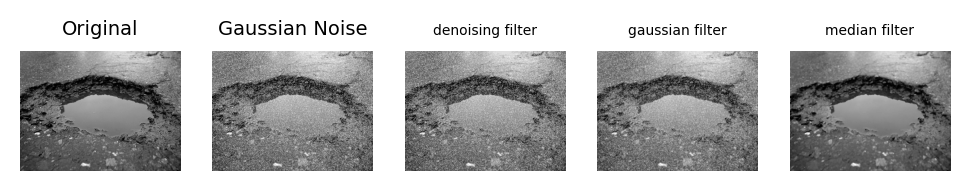

In [ ]:
# Generate Gaussian noise
gauss = np.random.normal(0,1,img.size)
gauss = gauss.reshape(img.shape[0],img.shape[1]).astype('uint8')
# Add the Gaussian noise to the image
img_gauss = cv2.add(img,gauss)
#denoising
new_image = cv2.fastNlMeansDenoising(img_gauss,None,10,10)
blurred22=cv2.GaussianBlur(img_gauss,(3,3),1)
med = cv2.medianBlur(img_gauss,5)
# Display the image
fig=plt.figure(dpi=200)

fig.add_subplot(1,5,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original",fontsize=7)

fig.add_subplot(1,5,2)
plt.imshow(img_gauss,cmap='gray')
plt.axis("off")
plt.title("Gaussian Noise",fontsize=7)

fig.add_subplot(1,5,3)
plt.imshow(new_image,cmap='gray')
plt.axis("off")
plt.title("denoising filter",fontsize=5)

fig.add_subplot(1,5,4)
plt.imshow(blurred22,cmap='gray')
plt.axis("off")
plt.title("gaussian filter",fontsize=5)

fig.add_subplot(1,5,5)
plt.imshow(med,cmap='gray')
plt.axis("off")
plt.title("median filter",fontsize=5)

4) Speckle Noise

Text(0.5, 1.0, 'median filter')

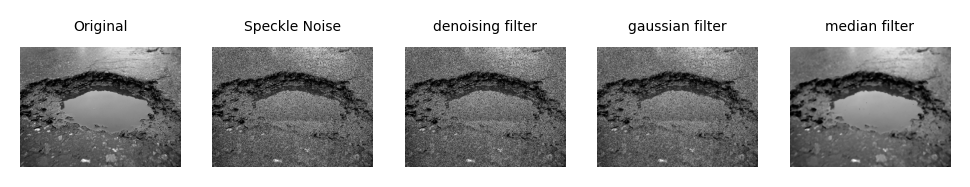

In [ ]:
gauss = np.random.normal(0,1,img.size)
gauss = gauss.reshape(img.shape[0],img.shape[1]).astype('uint8')
noise = img + img * gauss
fig=plt.figure(dpi=200)
#denoising
new_image = cv2.fastNlMeansDenoising(noise,None,10,10)
blurred22=cv2.GaussianBlur(noise,(3,3),1)
med = cv2.medianBlur(noise,7)

fig.add_subplot(1,5,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original",fontsize=5)

fig.add_subplot(1,5,2)
plt.imshow(noise,cmap='gray')
plt.axis("off")
plt.title("Speckle Noise",fontsize=5)

fig.add_subplot(1,5,3)
plt.imshow(new_image,cmap='gray')
plt.axis("off")
plt.title("denoising filter",fontsize=5)

fig.add_subplot(1,5,4)
plt.imshow(blurred22,cmap='gray')
plt.axis("off")
plt.title("gaussian filter",fontsize=5)

fig.add_subplot(1,5,5)
plt.imshow(med,cmap='gray')
plt.axis("off")
plt.title("median filter",fontsize=5)

5) Uniform Noise

Text(0.5, 1.0, 'median filter')

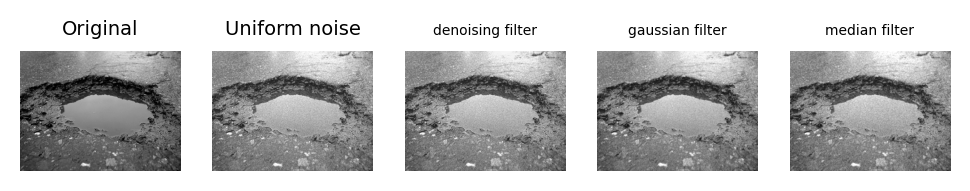

In [ ]:
uni_noise=np.zeros((480,640),dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.3).astype(np.uint8)
un_img=cv2.add(img,uni_noise)
#denoising
new_image = cv2.fastNlMeansDenoising(un_img,None,10,10)
blurred22=cv2.GaussianBlur(un_img,(3,3),1)
blurred2=cv2.medianBlur(un_img,3)
#cv2_imshow(blurred22)
fig=plt.figure(dpi=200)

fig.add_subplot(1,5,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original",fontsize=7)

fig.add_subplot(1,5,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("Uniform noise",fontsize=7)

fig.add_subplot(1,5,3)
plt.imshow(new_image,cmap='gray')
plt.axis("off")
plt.title("denoising filter",fontsize=5)

fig.add_subplot(1,5,4)
plt.imshow(blurred22,cmap='gray')
plt.axis("off")
plt.title("gaussian filter",fontsize=5)

fig.add_subplot(1,5,5)
plt.imshow(blurred2,cmap='gray')
plt.axis("off")
plt.title("median filter",fontsize=5)